In [11]:
#################################################################### Loading packages ####################################################################
%matplotlib inline
import numpy as np
import scipy.stats as scs
from matplotlib import pyplot as plt
from mpl_toolkits.basemap import Basemap
from tqdm import tqdm
import pickle
import math 
import re
from Censored_copula import truncgauss
from scipy.spatial import distance_matrix
import pandas as pd
from joblib import Parallel, delayed
import psutil
from sklearn import metrics
import matplotlib.dates as mdates
import math 
import tweedie
import sys
import os
plt.rcParams.update({'font.size': 30})

#################################################################### Loading GNM ####################################################################
model_version = 3 # 0 best
target_distribution = "compound_poisson"
base_nn = "HConvLSTM_tdscale"
sys.path.append('../')


path_ = f"Checkpoints/uk_rain_DGLM_{base_nn}_{target_distribution}/lightning_logs/version_{model_version}/"
#ckpt_path = glms.NeuralDGLM.get_ckpt_path(os.path.join(path_,"checkpoints"))
ckpt_path = 'Checkpoints/uk_rain_DGLM_HConvLSTM_tdscale_compound_poisson/lightning_logs/version_0/checkpoints/epoch=2-step=6423-val_loss_loss=-78.293-val_metric_mse_rain=25.894.ckpt'
print([path_,ckpt_path])
'''
scaler_features, scaler_target = glms.NeuralDGLM.load_scalers(path_)
model = glms.NeuralDGLM.load_from_checkpoint(ckpt_path, save_hparams=False, scaler_features=scaler_features, scaler_target=scaler_target)
model.freeze()
model.eval()
'''
GNM_output = pickle.load( open(os.path.join(path_,"test_output_1999-07_2019-07.pkl"),"rb") )

#################################################################### Problematic locations? ###############################################################

location_keys = list(GNM_output.keys())                 # '([0, 16], [44, 60])', ...
output_keys = list(GNM_output[location_keys[0]].keys()) # 0'pred_mu', 1'pred_disp', 2'target_did_rain', 3'target_rain_value', 4'date', 5'pred_p', 6'mask', 7'idx_loc_in_region'


# May have to remove a location that doesn't have 2002 days:
location_keys.remove(location_keys[344]) #to remove for 20_20_test
#################################################################### Utility functions ####################################################################
def give_lat_lon(location_key):
    return [ int(re.findall(r'\d+',string)[0]) for string in location_key.split(',')]

def is_loc_land(location,row,column):
    return GNM_output[location]['mask'][0][row][column]

#location_keys.remove('lat_50.95_49.35_lon_-4.55_-2.95') # 'lat_50.95_49.35_lon_-4.55_-2.95' has no data after week indexed 255, so I did not consider it.
day_dates = [pd.to_datetime(i).date() for i in GNM_output[location_keys[0]]['date']]
output_keys.remove('idx_loc_in_region') # not usefull
output_keys.remove('date') # no more usefull

#################################################################### Making list for land locations ####################################################################
#GNM_landonly[location][param][day]
# 0'pred_mu', 1'pred_disp', 2'target_did_rain', 3'target_rain_value', 4'pred_p', 5'location'

GNM_landonly = [] 
land_counter = -1
for location in tqdm(location_keys):
    for col in range(4):
        for row in range(4):
            if not is_loc_land(location,row,col):#check if land
               continue  
            land_counter+=1
            GNM_landonly.append([[],[],[],[],[]]) # parameters except location
            temp_lat_lon = give_lat_lon(location)
            GNM_landonly[land_counter].append([temp_lat_lon[1]-8+row,(temp_lat_lon[2])+6+col]) #location
            for param_idx,param in enumerate(output_keys[:-1]):
                for day in range(len(GNM_output[location_keys[0]][output_keys[0]])):
                    qqq = [location,param,day,row,col]
                    GNM_landonly[land_counter][param_idx].append(GNM_output[location][param][day][row,col])

dist_mat = distance_matrix(np.matrix([[GNM_landonly[loc][5][0],GNM_landonly[loc][5][1]] for loc in range(len(GNM_landonly))]),np.matrix([[GNM_landonly[loc][5][0],GNM_landonly[loc][5][1]] for loc in range(len(GNM_landonly))]))


['Checkpoints/uk_rain_DGLM_HConvLSTM_tdscale_compound_poisson/lightning_logs/version_3/', 'Checkpoints/uk_rain_DGLM_HConvLSTM_tdscale_compound_poisson/lightning_logs/version_0/checkpoints/epoch=2-step=6423-val_loss_loss=-78.293-val_metric_mse_rain=25.894.ckpt']
ERROR! Session/line number was not unique in database. History logging moved to new session 414


100%|██████████| 344/344 [01:32<00:00,  3.73it/s]


In [2]:
qqq

['([80, 96], [64, 80])', 'pred_mu', 10920, 0, 0]

In [3]:
for i,k in enumerate(location_keys):
    if k=='([80, 96], [64, 80])':
        print(i,k)

312 ([80, 96], [64, 80])


# Diagnostics

In [31]:
from sklearn.neighbors import NearestNeighbors
import numpy as np

# define the number of locations
num_locs = len(GNM_landonly)

# define the number of nearest neighbors to consider
k = 16

# get the coordinates of all locations
coords = np.array([GNM_landonly[loc][5] for loc in range(num_locs)])

# fit a nearest neighbors model to the coordinates
nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(coords)

# find the indices of the k nearest neighbors for each location
distances, indices = nbrs.kneighbors(coords)


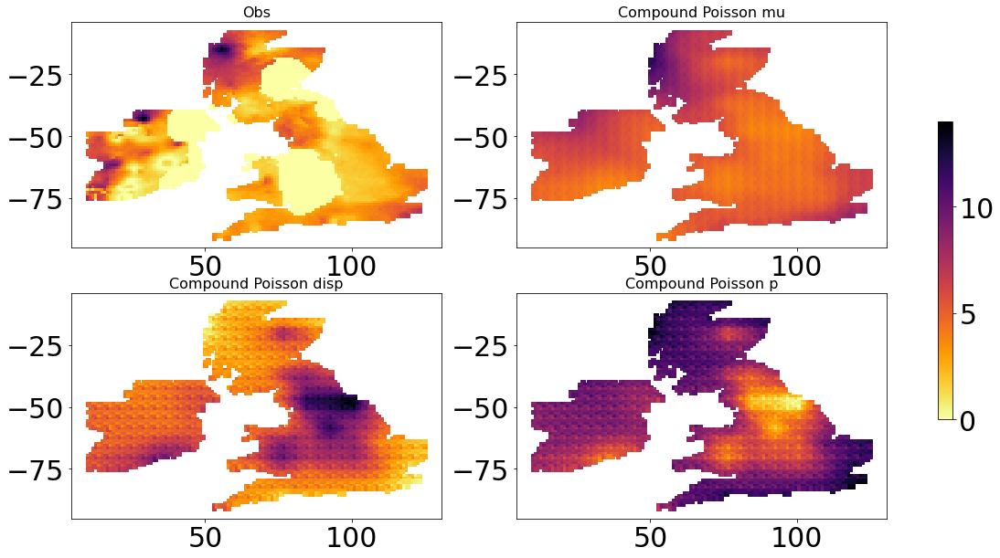

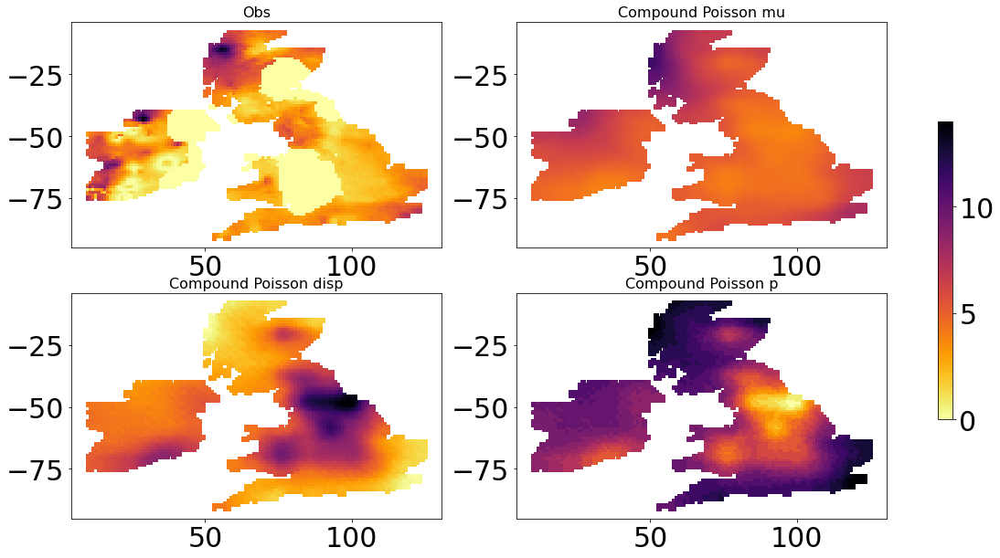

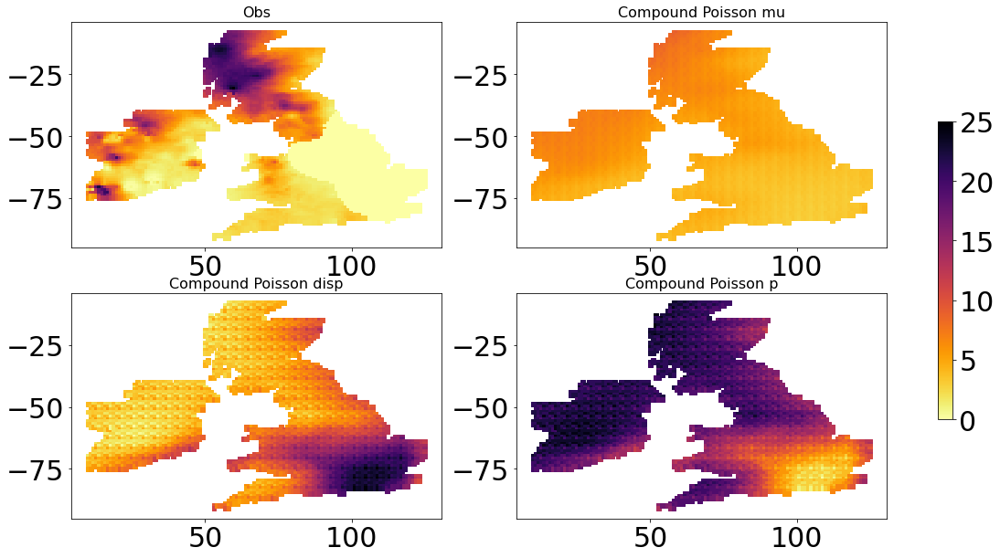

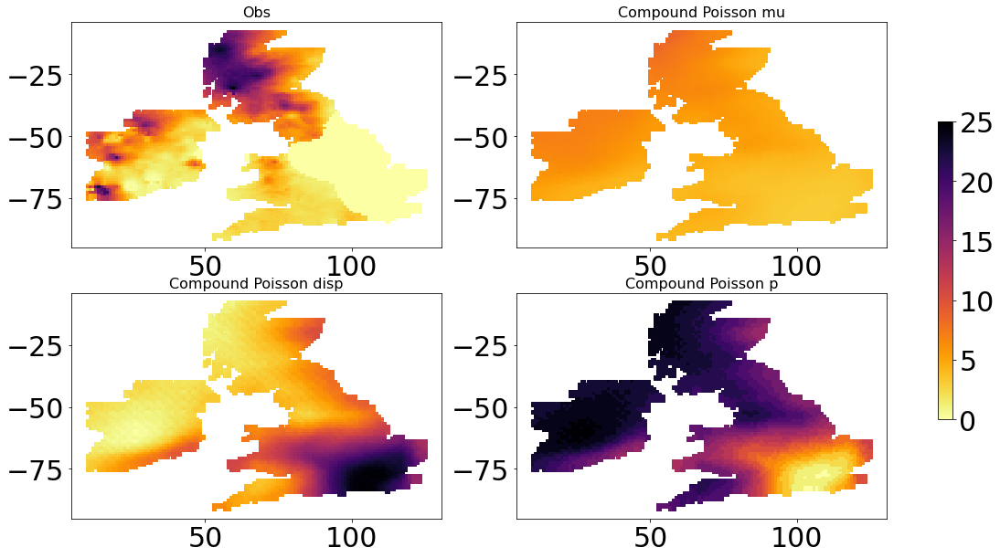

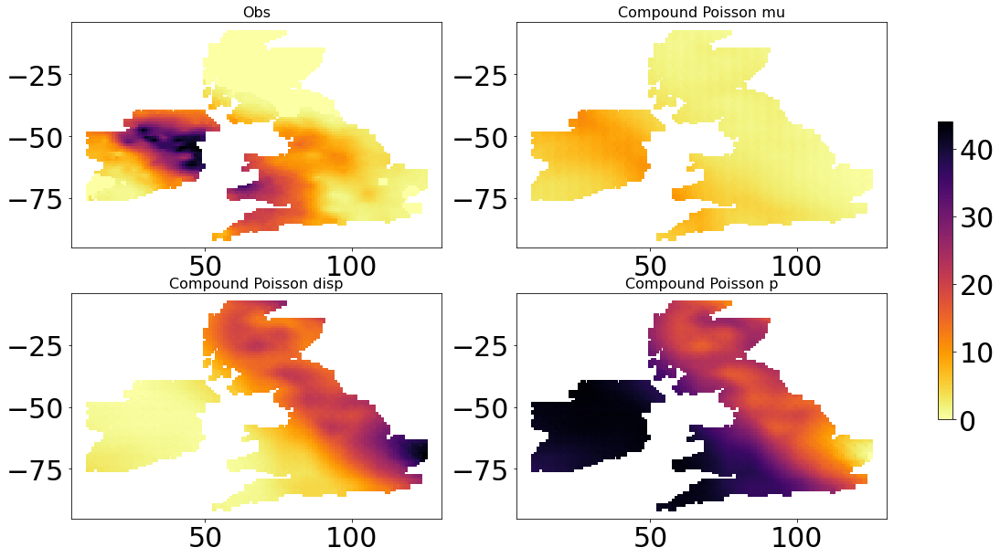

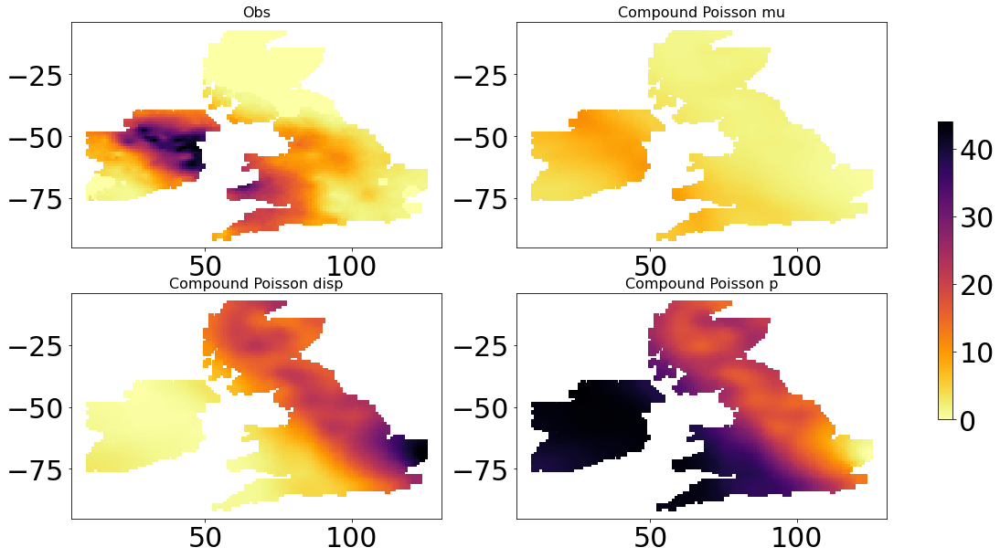

In [38]:
for day in np.random.choice(range(2002),size=3,replace=False):
    # create a figure with four subplots
    fig = plt.figure(figsize=(20, 10))
    axs = fig.subplots(2, 2)

    # get the maximum value for the color scale
    max_val = max([max([GNM_landonly[l][3][day] for l in range(4086)]), max([GNM_landonly[l][0][day] for l in range(4086)])])

    # plot the first map in the first subplot
    im1 = axs[0, 0].scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=[GNM_landonly[l][3][day] for l in range(4086)],cmap='inferno_r',s=24,marker='s', vmin=0, vmax=max_val)
    axs[0, 0].set_title('Obs')
    axs[0, 0].title.set_fontsize(16)

    # plot the second map in the second subplot
    im2 = axs[0, 1].scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=[GNM_landonly[l][0][day] for l in range(4086)],cmap='inferno_r',s=24,marker='s', vmin=0, vmax=max_val)
    axs[0, 1].set_title('Compound Poisson mu')
    axs[0, 1].title.set_fontsize(16)

    # plot the third map in the third subplot
    im3 = axs[1, 0].scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=[GNM_landonly[l][1][day] for l in range(4086)],cmap='inferno_r',s=24,marker='s')
    axs[1, 0].set_title('Compound Poisson disp')
    axs[1, 0].title.set_fontsize(16)

    # plot the fourth map in the fourth subplot
    im4 = axs[1, 1].scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=[GNM_landonly[l][4][day] for l in range(4086)],cmap='inferno_r',s=24,marker='s')
    axs[1, 1].set_title('Compound Poisson p')
    axs[1, 1].title.set_fontsize(16)

    # create a shared colorbar for all subplots
    fig.colorbar(im1, ax=axs.ravel().tolist(), shrink=0.6)

    plt.show()


    # create a figure with four subplots
    fig = plt.figure(figsize=(20, 10))
    axs = fig.subplots(2, 2)

    # get the maximum value for the color scale
    max_val = max([max([GNM_landonly[l][3][day] for l in range(4086)]), max([GNM_landonly[l][0][day] for l in range(4086)])])

    # plot the first map in the first subplot
    im1 = axs[0, 0].scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=[GNM_landonly[l][3][day] for l in range(4086)],cmap='inferno_r',s=24,marker='s', vmin=0, vmax=max_val)
    axs[0, 0].set_title('Obs')
    axs[0, 0].title.set_fontsize(16)

    # plot the second map in the second subplot
    im2 = axs[0, 1].scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=[np.mean([GNM_landonly[i][0][day] for i in indices[loc]]) for loc in range(4086)],cmap='inferno_r',s=24,marker='s', vmin=0, vmax=max_val)
    axs[0, 1].set_title('Compound Poisson mu')
    axs[0, 1].title.set_fontsize(16)

    # plot the third map in the third subplot
    im3 = axs[1, 0].scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=[np.mean([GNM_landonly[i][1][day] for i in indices[loc]]) for loc in range(4086)],cmap='inferno_r',s=24,marker='s')
    axs[1, 0].set_title('Compound Poisson disp')
    axs[1, 0].title.set_fontsize(16)

    # plot the fourth map in the fourth subplot
    im4 = axs[1, 1].scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=[np.mean([GNM_landonly[i][4][day] for i in indices[loc]]) for loc in range(4086)],cmap='inferno_r',s=24,marker='s')
    axs[1, 1].set_title('Compound Poisson p')
    axs[1, 1].title.set_fontsize(16)

    # create a shared colorbar for all subplots
    fig.colorbar(im1, ax=axs.ravel().tolist(), shrink=0.6)

    plt.show()

    

### Marginals

In [36]:
plt.figure(figsize=(25, 8),dpi=700)
plt.plot([ np.mean([GNM_landonly[i][0][k] for i in indices[33]]) for k in range(300)],label='mu')
plt.plot([GNM_landonly[33][3][k] for k in range(300)],label='target',linewidth=0.5)
plt.scatter(range(300),[GNM_landonly[33][3][i] for i in range(300)],color='r',marker='1',s=20)
plt.legend()

In [37]:
g_median = []
g_q68 = []
for m,d,p_,i in tqdm(zip([ np.mean([GNM_landonly[knn][0][i] for knn in indices[333]]) for i in range(300)],[np.mean([GNM_landonly[knn][1][i] for knn in indices[333]]) for i in range(300)],[np.mean([GNM_landonly[knn][4][i] for knn in indices[333]]) for i in range(300)],range(300))) :
    rv = tweedie.tweedie(mu=m,phi=d,p=p_)

    g_median.append(rv.ppf(0.5))
    g_q68.append(rv.ppf(0.68))
plt.figure(figsize=(25, 8),dpi=700)
plt.title('CP version '+str(model_version))
plt.plot(day_dates[:300],g_median,color='blue',linewidth=1,alpha=1)
plt.plot(day_dates[:300],g_q68,color='orange',linewidth=1,alpha=1)
plt.scatter(day_dates[:300],[GNM_landonly[333][3][i] for i in range(300)],color='r',marker='1',s=20)
plt.plot(day_dates[:300],[GNM_landonly[333][3][i] for i in range(300)],color='r',alpha=0.6,linewidth=0.3)
    
    

0it [00:00, ?it/s]

300it [00:18, 16.63it/s]


In [29]:
# Draw time-series plot with quantiles for predicted vs trget rain at a given location. ~3s 
# Just change values at the top.

#ts_plot_location = 3055
for ts_plot_location in [2000,2500]:
    print(ts_plot_location)
    ts_plot_left_lim,ts_plot_right_lim = ts_plot_location+100,ts_plot_location+460

    #################################################################### Do not touch the rest ####################################################################
    
    # mean and 68, 95 percentiles 
    g_median = []
    g_q25 = []
    g_q75 = []
    g_q68 = []
    g_q95 = []
    g_q32 = []
    g_q05 = []

    #GNM_landonly[location][param][day]
    ## 0'pred_mu', 1'pred_disp', 2'target_did_rain', 3'target_rain_value', 4'pred_p', 5'location'

    for m,d,p_,i in tqdm(zip([GNM_landonly[ts_plot_location][0][i] for i in range(ts_plot_left_lim,ts_plot_right_lim)],[GNM_landonly[ts_plot_location][1][i] for i in range(ts_plot_left_lim,ts_plot_right_lim)],[GNM_landonly[ts_plot_location][4][i] for i in range(ts_plot_left_lim,ts_plot_right_lim)],range(ts_plot_left_lim,ts_plot_right_lim))) :
        rv = tweedie.tweedie(mu=m,phi=d,p=p_)
        
        
        g_median.append(rv.ppf(0.5))
        g_q25.append(rv.ppf(0.25))
        g_q75.append(rv.ppf(0.75))
        g_q68.append(rv.ppf(0.68))
        g_q95.append(rv.ppf(0.95))
        g_q32.append(rv.ppf(0.32))
        g_q05.append(rv.ppf(0.05))

    for q in [g_median,g_q25,g_q05,g_q32,g_q68,g_q75,g_q95]:
        for i in range(len(q)):
            if math.isnan(q[i]):
                q[i]=0
     
    plt.figure(figsize=(25, 8),dpi=700)
    plt.plot(day_dates[ts_plot_left_lim:ts_plot_right_lim],g_q05,color='skyblue',linewidth=0.6,alpha=0.3)
    plt.plot(day_dates[ts_plot_left_lim:ts_plot_right_lim],g_q25,color='navy',linewidth=0.6,alpha=0.3)
    plt.plot(day_dates[ts_plot_left_lim:ts_plot_right_lim],g_median,color='blue',linewidth=1,alpha=1)
    plt.plot(day_dates[ts_plot_left_lim:ts_plot_right_lim],g_q75,color='navy',linewidth=0.6,alpha=0.3)
    plt.plot(day_dates[ts_plot_left_lim:ts_plot_right_lim],g_q95,color='skyblue',linewidth=0.6,alpha=0.3)
    plt.fill_between(day_dates[ts_plot_left_lim:ts_plot_right_lim], g_median, g_q75, where=([g_median[k] < g_q75[k] for k in range(ts_plot_right_lim-ts_plot_left_lim)]), color='navy', alpha=0.6,interpolate=True)
    plt.fill_between(day_dates[ts_plot_left_lim:ts_plot_right_lim], g_median, g_q25, where=([g_median[k] > g_q25[k] for k in range(ts_plot_right_lim-ts_plot_left_lim)]), color='navy', alpha=0.6,interpolate=True)
    plt.fill_between(day_dates[ts_plot_left_lim:ts_plot_right_lim], g_q95, g_q75, where=([g_q95[k] > g_q75[k] for k in range(ts_plot_right_lim-ts_plot_left_lim)]), color='skyblue', alpha=0.6,interpolate=True)
    plt.fill_between(day_dates[ts_plot_left_lim:ts_plot_right_lim], g_q05, g_q25, where=([g_q05[k] < g_q25[k] for k in range(ts_plot_right_lim-ts_plot_left_lim)]), color='skyblue', alpha=0.6,interpolate=True)
    plt.scatter(day_dates[ts_plot_left_lim:ts_plot_right_lim],[GNM_landonly[ts_plot_location][3][i] for i in range(ts_plot_right_lim-ts_plot_left_lim)],color='r',marker='1',s=20)
    plt.plot(day_dates[ts_plot_left_lim:ts_plot_right_lim],[GNM_landonly[ts_plot_location][3][i] for i in range(ts_plot_right_lim-ts_plot_left_lim)],color='r',alpha=0.6,linewidth=0.3)
    #plt.xlim((day_dates[ts_plot_left_lim],day_dates[ts_plot_right_lim]))
    plt.title('CP model at location '+str(GNM_landonly[ts_plot_location][5]))
    plt.xlabel('Day index')
    plt.ylabel('Precipitation (mm)')
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=14))
    plt.gcf().autofmt_xdate()
    plt.show()

2000


360it [01:08,  5.24it/s]


2500


257it [00:45,  5.71it/s]


KeyboardInterrupt: 

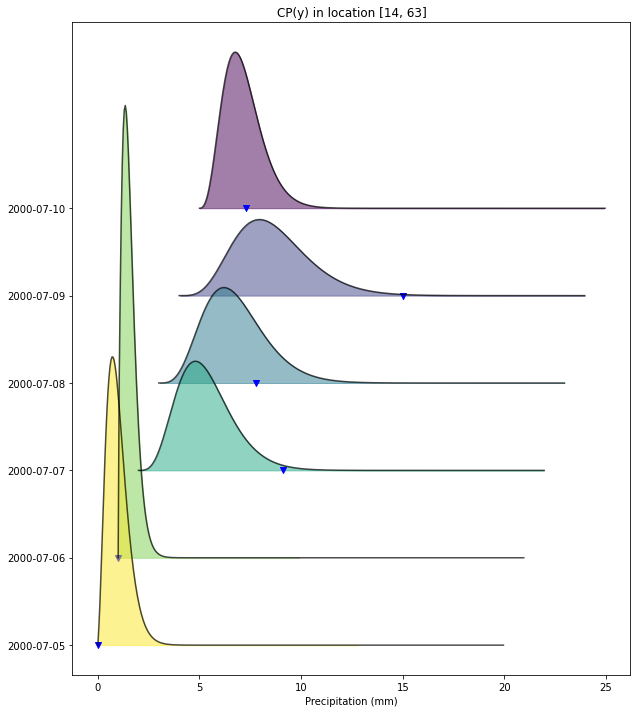

In [111]:
# Densities plots
# Just change values at the top.

density_plot_location = 111
density_plot_start,density_plot_end = 370,376

#################################################################### Do not touch the rest ####################################################################
import matplotlib

x=[i/20 for i in range(400)]
plt.figure(figsize=(10,(density_plot_end-density_plot_start)*2))
colors = matplotlib.cm.viridis(np.linspace(0, 1, len(range(density_plot_end,density_plot_start,-1))))
for idx,col in zip(reversed(range(density_plot_start-1,density_plot_end)),colors):
    rv=tweedie.tweedie(mu=[GNM_landonly[density_plot_location][0][i] for i in range(len(GNM_landonly[density_plot_location][4]))][idx],phi=[GNM_landonly[density_plot_location][1][i] for i in range(len(GNM_landonly[density_plot_location][4]))][idx],p=[GNM_landonly[density_plot_location][4][i] for i in range(len(GNM_landonly[density_plot_location][4]))][idx])
    level=(-0.3+(idx+1-density_plot_start)*0.25)
    plt.plot([k+idx-370 for k in x],level+rv.pdf(x),color='black',alpha=0.7)
    plt.fill_between([k+idx-370 for k in x],y1=level+rv.pdf(x),y2=level,where=([level+rv.pdf(x_)>level for x_ in x]),color=col,alpha=0.5)
    #plt.text(15+idx-370,level+0.03,'p= '+str(round([GNM_landonly[density_plot_location][4][i] for i in range(len(GNM_landonly[ts_plot_location][4]))][idx],2)))
    plt.scatter([GNM_landonly[density_plot_location][3][i]+idx-370 for i in range(len(GNM_landonly[density_plot_location][4]))][idx],level,marker='v',color='b')
plt.xlabel('Precipitation (mm)')
plt.title('CP(y) in location '+str(GNM_landonly[density_plot_location][5]))
plt.yticks([-0.3+(idx-density_plot_start)*0.25 for idx in range(density_plot_end,density_plot_start,-1)],reversed([pd.to_datetime(i).date() for i in GNM_output[location_keys[0]]['date'][density_plot_start:density_plot_end]]))
#plt.yticks([-0.3+(idx-density_plot_start)*0.25 for idx in range(density_plot_end,density_plot_start,-1)],[k for k in range([density_plot_start:density_plot_end]])
plt.show()

### Simulations

In [12]:
subsample_of_days = np.random.choice(range(len(GNM_landonly[0][1])),size=400,replace=False)

# Simulation

sim_day = 400
sim_locations = range(50)
kernel_type = 'Matern'
theta_values = [800,10] # MLE gave [4.01,3.08]
nb_samples = 3

#################################################################### Do not touch the rest ####################################################################

# Utility function
def g_Finv(day_id,loc_id,u): # take u to a value of rain according to the gamma density for that day and location
    if 1-GNM_landonly[loc_id][4][day_id]>=u: #if 1-p>u, invcdf is 0 rain
        return 0
    else: # invcdf( (u-1+p) /p)
        return scs.gamma(scale=GNM_landonly[loc_id][1][day_id]*GNM_landonly[loc_id][0][day_id],a=1/GNM_landonly[loc_id][1][day_id]).ppf((u-1+GNM_landonly[loc_id][4][day_id])/GNM_landonly[loc_id][4][day_id])

# Define censor levels pi on normal scale := di. This is done for the whole dataset, no need to touch.

censored_di = [[GNM_landonly[loc][4][day] for loc in range(4087)] for day in tqdm(range(7031))] # di[day][loc]
censored_di = scs.norm.ppf(np.array(censored_di))

# Simulating Draws. Dependent on given day and locations.
simulated_us = truncgauss(dist_mat[:max(sim_locations),:max(sim_locations)]).sim(theta=theta_values,inv_us=censored_di,draws=nb_samples,day_idx=sim_day,kernel=kernel_type)

print('Simulations done!')

100%|██████████| 7031/7031 [00:06<00:00, 1113.53it/s]


Simulations done!


### Median forecast

In [ ]:
# Median rain forecasts for all days and locations
#GNM_landonly[location][param][day]


# Used to get the vectors for all locations and all times, not needed after that.

g_median_all=[]

np.random.seed(3)
subset = np.random.choice(range(7301),size=720)

for loc in tqdm(range(len(GNM_landonly))):
    for day in subset:
        m,d,p_ = GNM_landonly[loc][0][day] , GNM_landonly[loc][1][day] , GNM_landonly[loc][4][day]
        rv = tweedie.tweedie(mu=m,phi=d,p=p_)
        g_median_all.append(rv.ppf((GNM_landonly[loc][4][day]-1+0.5)/GNM_landonly[loc][4][day]))

g_median_all = np.nan_to_num(g_median_all,copy=True)

with open('g_median_all_20y_20y.txt','wb') as f:
    pickle.dump(g_median_all,f)

'''
with open('g_median_all_20y_20y.txt','rb') as f:
    g_median_all = pickle.load(f)
g_median_all_test = np.nan_to_num(g_median_all,nan=0)
'''

100%|██████████| 4087/4087 [4:24:13<00:00,  3.88s/it]  


"\nwith open('g_median_all_20y_20y.txt','rb') as f:\n    g_median_all = pickle.load(f)\ng_median_all_test = np.nan_to_num(g_median_all,nan=0)\n"

### ROC

In [85]:
'''with open('day_subset_marginals.txt','wb') as f:
    pickle.dump(day_subset,f)'''
with open('day_subset_marginals.txt','rb') as f:
    day_subset = pickle.load(f)

In [18]:
# getting vector of 'did it rain this much'
g_0mm=[]
g_5mm=[]
g_10mm=[]
g_15mm=[]
g_20mm=[]
g_25mm=[]

#GNM_landonly[location][param][day]
# 0'pred_alpha', 1'pred_beta', 2 rain>0 , 3'target_rain', 4 pred_p, 5 loc

def fast_roc(day,x):
   # 0'pred_mu', 1'pred_disp', 2'target_did_rain', 3'target_rain_value', 4'pred_p', 5'location'

   out = 1-tweedie.tweedie(mu=[GNM_landonly[l][0][day] for l in range(len(GNM_landonly))],
                           phi=[GNM_landonly[l][1][day] for l in range(len(GNM_landonly))],
                           p=[GNM_landonly[l][4][day] for l in range(len(GNM_landonly))]).cdf(np.repeat(x,len(GNM_landonly)))

   return out
fast_roc(0,5)


for d in tqdm(day_subset):
   g_0mm.append(fast_roc(d,0.01))
   g_5mm.append(fast_roc(d,5))
   g_10mm.append(fast_roc(d,10))
   g_15mm.append(fast_roc(d,15))
   g_20mm.append(fast_roc(d,20))
   g_25mm.append(fast_roc(d,25))

g_0mm_did_rain=[]
g_5mm_did_rain=[]
g_10mm_did_rain=[]
g_15mm_did_rain=[]
g_20mm_did_rain=[]
g_25mm_did_rain=[]
def roc_didrain(day,x):
    return np.array([GNM_landonly[l][3][day] for l in range(len(GNM_landonly))])>x
for d in tqdm(day_subset):
   g_0mm_did_rain.append(roc_didrain(d,0.01))
   g_5mm_did_rain.append(roc_didrain(d,5))
   g_10mm_did_rain.append(roc_didrain(d,10))
   g_15mm_did_rain.append(roc_didrain(d,15))
   g_20mm_did_rain.append(roc_didrain(d,20))
   g_25mm_did_rain.append(roc_didrain(d,25))

  0%|          | 0/500 [00:00<?, ?it/s]C:\Users\u1819911\AppData\Roaming\Python\Python39\site-packages\tweedie\tweedie_dist.py:523: RuntimeWarning: divide by zero encountered in log
  logcdf = np.log(np.exp(W).sum(axis=1))
100%|██████████| 500/500 [00:07<00:00, 64.60it/s] 


In [86]:
# Drawing uniformly from marginals to compare vs CP
def GNM_unif_to_y(day):
    return tweedie.tweedie(mu=np.tile([GNM_landonly[l][0][day] for l in range(len(GNM_landonly))],(100,1)),
                           phi=np.tile([GNM_landonly[l][1][day] for l in range(len(GNM_landonly))],(100,1)),
                           p=np.tile([GNM_landonly[l][4][day] for l in range(len(GNM_landonly))],(100,1))).rvs()

sims_all_copula = []
for d in tqdm(day_subset):
    sims_all_copula.append(GNM_unif_to_y(d)) # HERE IS NOT COPULA BUT JUST UNIFORM

100%|██████████| 500/500 [01:20<00:00,  6.19it/s]


In [23]:
np.array(sims_all_copula).shape

(500, 100, 4087)

In [73]:
# sampling uniformly from CP and doing ROc that way to compar vs gamma


# ROC for samples
sims_all_copula = np.array(sims_all_copula)
g_0mm=np.mean(sims_all_copula>0,axis=1).flatten()
g_5mm=np.mean(sims_all_copula>5,axis=1).flatten()
g_10mm=np.mean(sims_all_copula>10,axis=1).flatten()
g_15mm=np.mean(sims_all_copula>15,axis=1).flatten()
g_20mm=np.mean(sims_all_copula>20,axis=1).flatten()
g_25mm=np.mean(sims_all_copula>25,axis=1).flatten()
all_target_rain = np.array([np.array([GNM_landonly[loc][3][day] for day in day_subset])for loc in range(len(GNM_landonly))]).flatten().reshape(len(GNM_landonly),len(day_subset))
g_0mm_did_rain=(all_target_rain.transpose()>0).flatten()
g_5mm_did_rain=(all_target_rain.transpose()>5).flatten()
g_10mm_did_rain=(all_target_rain.transpose()>10).flatten()
g_15mm_did_rain=(all_target_rain.transpose()>15).flatten()
g_20mm_did_rain=(all_target_rain.transpose()>20).flatten()
g_25mm_did_rain=(all_target_rain.transpose()>25).flatten()

In [74]:
# Restructuring data for ROC ~1m+3m/20y , 6m/30y
from sklearn import metrics
# g_25mm[loc][parallel run][0:rained more than x, 1:P it rained x][days]
roc_0_tf = np.array(g_0mm_did_rain).flatten()
roc_0_p = np.array(g_0mm).flatten()

roc_5_tf = np.array(g_5mm_did_rain).flatten()
roc_5_p = np.array(g_5mm).flatten()

roc_10_tf = np.array(g_10mm_did_rain).flatten()
roc_10_p = np.array(g_10mm).flatten()

roc_15_tf = np.array(g_15mm_did_rain).flatten()
roc_15_p = np.array(g_15mm).flatten()

roc_20_tf = np.array(g_20mm_did_rain).flatten()
roc_20_p = np.array(g_20mm).flatten()

roc_25_tf = np.array(g_25mm_did_rain).flatten()
roc_25_p = np.array(g_25mm).flatten()

###

fpr_0mm, tpr_0mm, _ = metrics.roc_curve(roc_0_tf,roc_0_p)
auc0 = metrics.roc_auc_score(roc_0_tf,roc_0_p)

fpr_5mm, tpr_5mm, _ = metrics.roc_curve(roc_5_tf,roc_5_p)
auc5 = metrics.roc_auc_score(roc_5_tf,roc_5_p)

fpr_10mm, tpr_10mm, _ = metrics.roc_curve(roc_10_tf,roc_10_p)
auc10 = metrics.roc_auc_score(roc_10_tf,roc_10_p)

fpr_15mm, tpr_15mm, _ = metrics.roc_curve(roc_15_tf,roc_15_p)
auc15 = metrics.roc_auc_score(roc_15_tf,roc_15_p)

fpr_20mm, tpr_20mm, _ = metrics.roc_curve(roc_20_tf,roc_20_p)
auc20 = metrics.roc_auc_score(roc_20_tf,roc_20_p)

fpr_25mm, tpr_25mm, _ = metrics.roc_curve(roc_25_tf,roc_25_p)
auc25 = metrics.roc_auc_score(roc_25_tf,roc_25_p)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


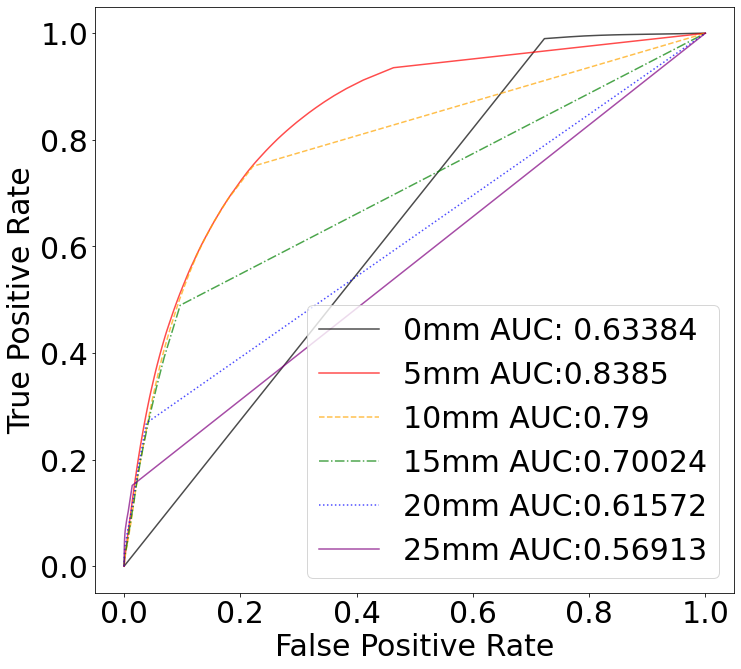

In [75]:
# ROC plot ~3m
plt.figure(figsize=(11,10))
plt.plot(fpr_0mm,tpr_0mm,label='AUC='+str(auc0),color='black',alpha=0.7)

plt.plot(fpr_5mm,tpr_5mm,label='AUC='+str(auc5),color='red',alpha=0.7)

plt.plot(fpr_10mm,tpr_10mm,label='AUC='+str(auc10),color='orange',alpha=0.7,linestyle='dashed')

plt.plot(fpr_15mm,tpr_15mm,label='AUC='+str(auc15),color='green',alpha=0.7,linestyle='dashdot')

plt.plot(fpr_20mm,tpr_20mm,label='AUC='+str(auc20),color='blue',alpha=0.7,linestyle='dotted')

plt.plot(fpr_25mm,tpr_25mm,label='AUC='+str(auc25),color='purple',alpha=0.7)


plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(['0mm AUC: '+str(round(auc0,5)),'5mm AUC:'+str(round(auc5,5)),'10mm AUC:'+str(round(auc10,5)),'15mm AUC:'+str(round(auc15,5)),'20mm AUC:'+str(round(auc20,5)),'25mm AUC:'+str(round(auc25,5))])
plt.tight_layout()
plt.savefig('ROC_CP20y_test_v3_marginal_diagnostic.eps', format='eps')
#plt.title('Gamma Model United Kingdom')
#plt.savefig('ROC Gamma model UK')

In [ ]:
#Saving data
with open('g_0mm.txt','wb') as f:
    pickle.dump(g_0mm,f)
with open('g_5mm.txt','wb') as f:
    pickle.dump(g_5mm,f)
with open('g_10mm.txt','wb') as f:
    pickle.dump(g_10mm,f)
with open('g_15mm.txt','wb') as f:
    pickle.dump(g_15mm,f)
with open('g_20mm.txt','wb') as f:
    pickle.dump(g_20mm,f)
with open('g_25mm.txt','wb') as f:
    pickle.dump(g_25mm,f)
'''
# Loading data
with open('g_0mm.txt','rb') as f:
    g_0mm = pickle.load(f)
with open('g_5mm.txt','rb') as f:
    g_5mm = pickle.load(f)
with open('g_10mm.txt','rb') as f:
    g_10mm = pickle.load(f)
with open('g_15mm.txt','rb') as f:
    g_15mm = pickle.load(f)
with open('g_20mm.txt','rb') as f:
    g_20mm = pickle.load(f)
with open('g_25mm.txt','rb') as f:
    g_25mm = pickle.load(f)'''

### Spread-Skill

In [341]:
# Spread-Skill but with variance as spread directly.
 
RMS_spread = [] # should get 2002 entries, each being the average RMS across all locations and draws, for that day.
RMS_skill = [] # should get 2002 entries, each being the average RMS across all locations, for that day.

for day in tqdm(range(len(GNM_landonly[0][1]))):
    # The expression used below is the RMS spread for one day: a single number, the average variance across all locations.
    RMS_spread.append(
        np.mean( # average over samples and locations 
             [(GNM_landonly[loc][4][day]*np.power(GNM_landonly[loc][0][day],2)*(GNM_landonly[loc][1][day]+1) - np.power(GNM_landonly[loc][4][day],2)*np.power(GNM_landonly[loc][0][day],2)) for loc in range(len(GNM_landonly))
                ]))
    
    # The expression below is the RMS skill for one day: a single number giving the average across all locations of the squared difference of median forecast and target
    RMS_skill.append(
        np.mean( # average over locations
            np.power( # square
                np.subtract( # difference
                    np.transpose(np.array(g_median_all).reshape((len(GNM_landonly),7301)))[day,:] # median for that day across all locations
                    ,[GNM_landonly[loc][3][day] for loc in range(len(GNM_landonly))] ) # target rain for that day across all locations
                    ,2) # square
                    ))

100%|██████████| 7301/7301 [18:33<00:00,  6.55it/s]


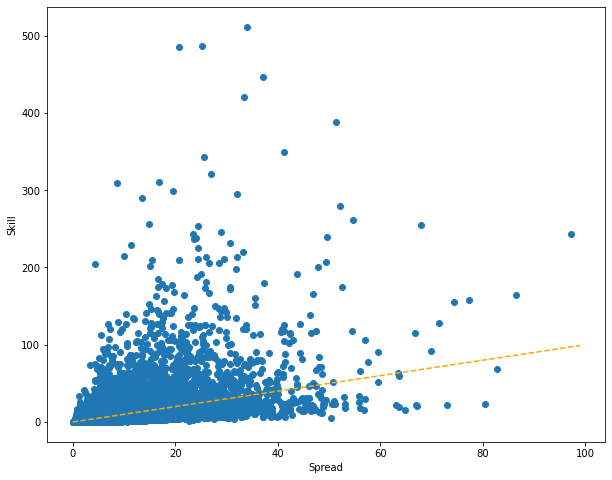

In [406]:
# Skill-Spread over all days
plt.figure(figsize=(10,8))
plt.scatter(RMS_spread,RMS_skill)
plt.plot(range(100),range(100),color='orange',linestyle='--')
plt.ylabel('Skill')
plt.xlabel('Spread')

plt.show()

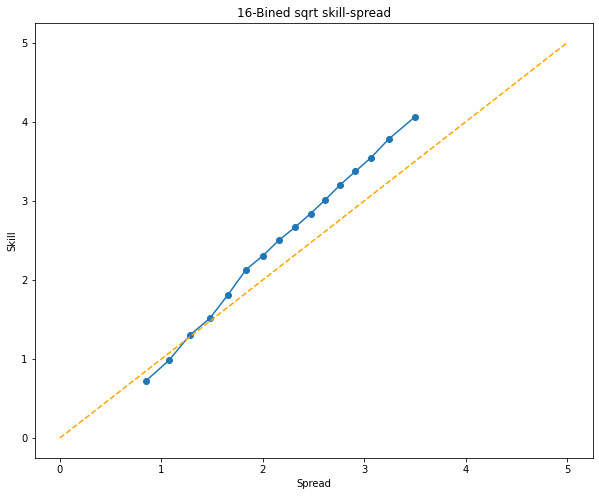

Text(0.5, 0, 'Spread')

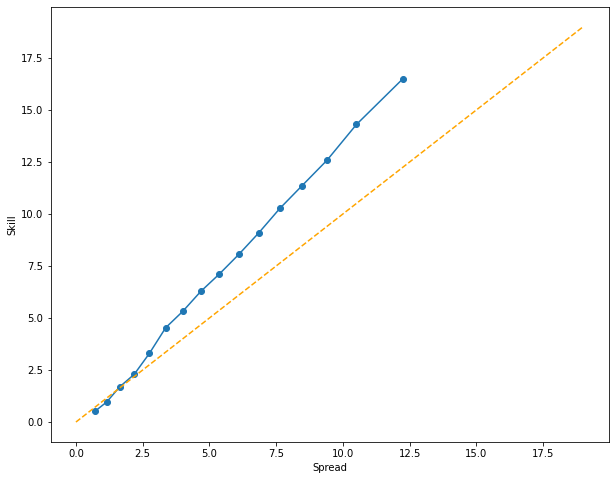

In [404]:
# 16-Bined skill-spread - Need to draw samples of u first. 
# They are then used for each day.
binned_skill = [math.sqrt(np.mean(np.array(RMS_skill)[np.array(RMS_spread)<np.quantile(RMS_spread,q/16)])) for q in range(1,17)]
binned_spread = [math.sqrt(np.mean(np.array(RMS_spread)[np.array(RMS_spread)<np.quantile(RMS_spread,q/16)])) for q in range(1,17)]
plt.figure(figsize=(10,8))
plt.plot(binned_spread,binned_skill,'-o')
plt.plot(range(6),range(6),color='orange',linestyle='--')
plt.ylabel('Skill')
plt.xlabel('Spread')
plt.title('16-Bined sqrt skill-spread')
#plt.xlim(10,25)
#plt.ylim(5,20)
plt.show()
binned_skill = [np.mean(np.array(RMS_skill)[np.array(RMS_spread)<np.quantile(RMS_spread,q/16)]) for q in range(1,17)]
binned_spread = [np.mean(np.array(RMS_spread)[np.array(RMS_spread)<np.quantile(RMS_spread,q/16)]) for q in range(1,17)]
plt.figure(figsize=(10,8))

plt.plot(binned_spread,binned_skill,'-o')
plt.plot(range(20),range(20),color='orange',linestyle='--')
plt.ylabel('Skill')
plt.xlabel('Spread')


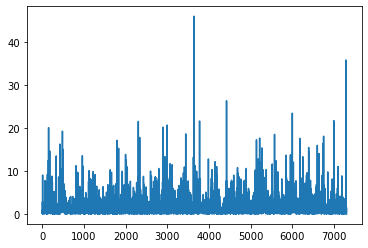

In [366]:
plt.plot(np.divide(RMS_skill,RMS_spread))

### 1 - ecdf

In [36]:
def F_inv_CP(day,u):
    test = []
    for k in range(100):
        test.append(tweedie.tweedie(mu=[GNM_landonly[l][0][day] for l in range(len(GNM_landonly))],
                           phi=[GNM_landonly[l][1][day] for l in range(len(GNM_landonly))],
                           p=[GNM_landonly[l][4][day] for l in range(len(GNM_landonly))]).rvs())
    return np.quantile(test,u,axis=0)

In [22]:
F_inv_CP(0,0.5)

array([2.17840026, 2.51614696, 2.35660516, ..., 1.50544449, 1.62319333,
       1.5541174 ])

In [83]:
with open('x_y_CP_ecfd_500_subdays_samples_v3.txt','wb') as f:
    pickle.dump([gamma_sampled_ecdf.x[::100],1-gamma_sampled_ecdf.y[::100]],f)

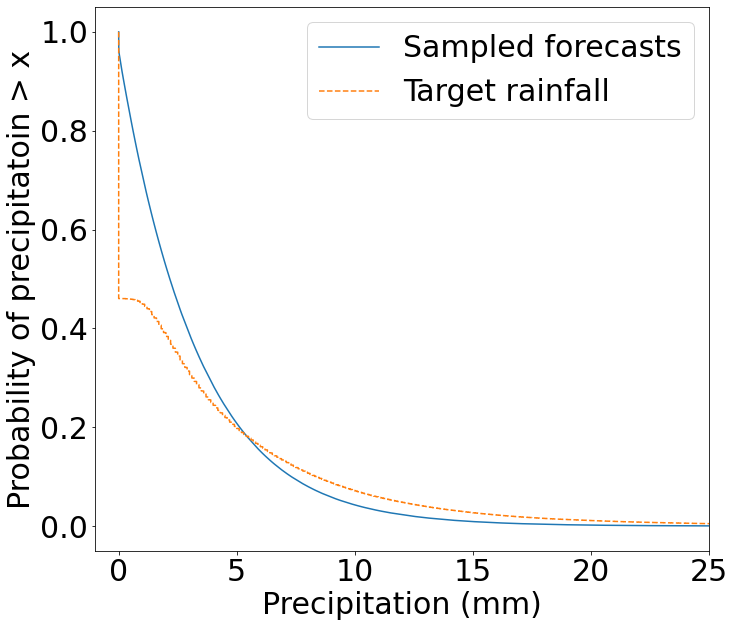

In [76]:
# P(rain>x) ~1m15 now. depending on samples and days used. all data an 10 samples->10h 
from statsmodels.distributions.empirical_distribution import ECDF
# transform us to rainfall over set of days and all locations
'''day_subset = np.random.choice(range(2002),13)
sampled_rain_all = np.array([np.array([np.array([g_Finv(day,loc,simulated_us[draw][loc]) for loc in range(4087)]) for day in day_subset]) for draw in range(3)]) # 2s per day * samples * days
sampled_rain_flatten_all = sampled_rain_all.flatten()'''
# get empirical cdfs for median, sampled and target rain.
#gamma_ecdf = ECDF(median_rain_flatten_all)
target_ecdf = ECDF(np.array([np.array([GNM_landonly[loc][3][day] for loc in range(4087)]) for day in day_subset]).flatten())
gamma_sampled_ecdf = ECDF(sims_all_copula.flatten())
plt.figure(figsize=(11,10))
#plt.plot(gamma_ecdf.x,1-gamma_ecdf.y,label='Median forecast')
plt.plot(gamma_sampled_ecdf.x[::100],1-gamma_sampled_ecdf.y[::100],label='Sampled forecasts')
plt.plot(target_ecdf.x,1-target_ecdf.y,linestyle='--',label='Target rainfall')
plt.xlabel('Precipitation (mm)')
plt.ylabel('Probability of precipitatoin > x')
plt.xlim(-1,25)
plt.legend()

### RMSB MAB

In [355]:
# RMSB and MAB metrics across all days and locations ~4.9s
all_target_rain = np.array([np.array([GNM_landonly[loc][3][day]for day in range(7301)])for loc in range(4087)]).flatten().reshape(4087,7301) # [loc,day]
RMSB = math.sqrt(np.mean(np.power(np.subtract(all_target_rain,np.array(g_median_all).reshape((4087,7301))),2)))
MAB = np.mean(np.abs(all_target_rain-np.array(g_median_all).reshape((4087,7301))))
print('MAB = '+str(MAB)+', RMSB = '+str(RMSB))

MAB = 2.1297531009447055, RMSB = 4.06679230062377


In [403]:
# Plot RMSB and MAB across time, averaged over all locations. 
import matplotlib.dates as mdates
plt.figure(figsize=(25,8),dpi=700)

RMSB_matrix = np.power(np.subtract(all_target_rain,np.array(g_median_all).reshape((4087,7301))),2)
MAB_matrix = np.abs(all_target_rain-np.array(g_median_all).reshape((4087,7301)))
RMSB_ts = [math.sqrt(np.mean(RMSB_matrix[:,day])) for day in range(7301)]
MAB_ts = [np.mean(MAB_matrix[:,day]) for day in range(7301)]
plt.plot(day_dates,RMSB_ts,alpha=0.6,label='RMSB')
plt.plot(day_dates,MAB_ts,alpha=0.6,label='MAB')
plt.legend()

plt.ylabel('Precipitation bias (mm)')
plt.xlabel('Date')
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=round(7301/15)))
plt.gcf().autofmt_xdate()
plt.show()

In [ ]:
plt.hist(RMSB_ts)
plt.title('RMSB across days')
plt.show()
plt.hist(MAB_ts)
plt.title('MAB across days')
plt.show()

### Bias Maps

In [360]:
# Bias maps 2*2
test_arr = np.array([np.mean(sampled_rain_flatten_all.reshape(3,53118)[:,column]) for column in range(53118)]).reshape(13,4086)

MAB_map = [np.mean(MAB_matrix[loc,:]) for loc in range(4086)]
RMSB_map = [math.sqrt(np.mean(RMSB_matrix[loc,:])) for loc in range(4086)]
Bias_map = np.matrix(np.array(g_median_all).reshape((4087,2000))-all_target_rain).mean(1).tolist()[:-1]
day_subset = np.random.choice(range(2000),50)
Sampled_bias = np.divide(np.array([np.mean(test_arr[:,loc]) for loc in range(4086)])-np.array([np.mean(np.transpose(all_target_rain[loc,day_subset])) for loc in range(4086)]), # difference 
np.array([np.mean(np.transpose(all_target_rain[loc,day_subset])) for loc in range(4086)])) # normalize by average target

fig, axes = plt.subplots(nrows=2, ncols=2,sharex=True,sharey=True,figsize=(12.5,8.5))
for day,ax in tqdm(enumerate(axes.flat)):
    
    fig.set_dpi(500)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticklabels([])
    plt.subplots_adjust(wspace=0, hspace=0)
    if day==0:
        #ax.set_title('MAB of median', y=1.0, pad=-10,size=10)
        im=ax.scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=MAB_map,s=3.3,marker='s')
        fig.colorbar(im,ax=ax,location='left',fraction=0.03,pad=0.001).ax.tick_params(labelsize=3) 
        
    elif day==1:
        #ax.set_title('RMSB of median', y=1.0, pad=-10,size=10)
        im=ax.scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=RMSB_map,s=3.3,marker='s')
        fig.colorbar(im,ax=ax,location='left',fraction=0.03,pad=0.001)
    elif day==2:
        #ax.set_title('Bias of median', y=1.0, pad=-10,size=10)
        im=ax.scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=Bias_map,cmap='BrBG',s=3.3,marker='s',vmin=-4,vmax=4)
        fig.colorbar(im,ax=ax,location='left',fraction=0.03,pad=0.001)
    else:
        #ax.set_title('Bias of 10 averaged samples', y=1.0, pad=-10,size=10)
        im=ax.scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=Sampled_bias,cmap='BrBG',s=3.3,marker='s',vmin=-5,vmax=5)
        fig.colorbar(im,ax=ax,location='left',fraction=0.03,pad=0.001)

plt.show()

ValueError: cannot reshape array of size 29839187 into shape (4087,2000)

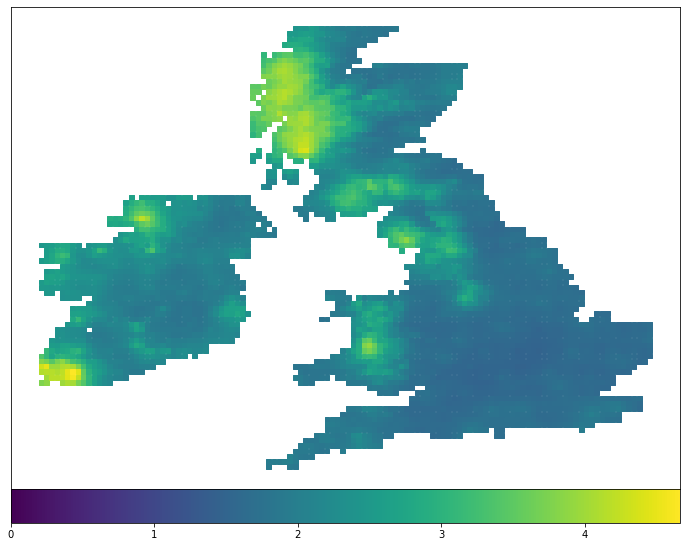

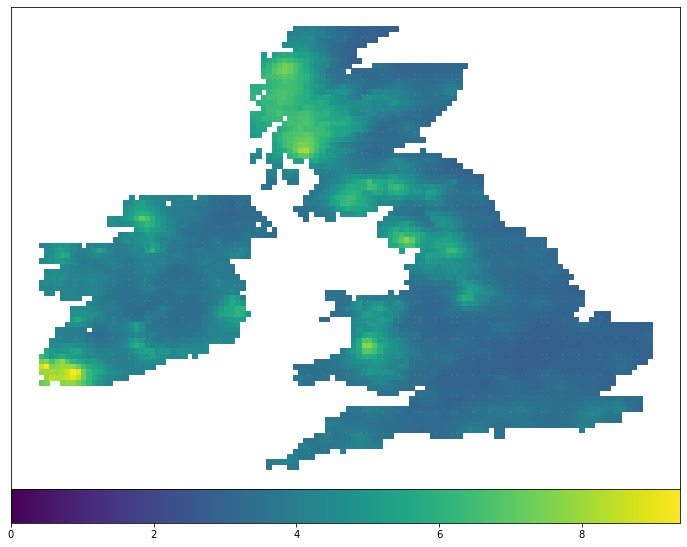

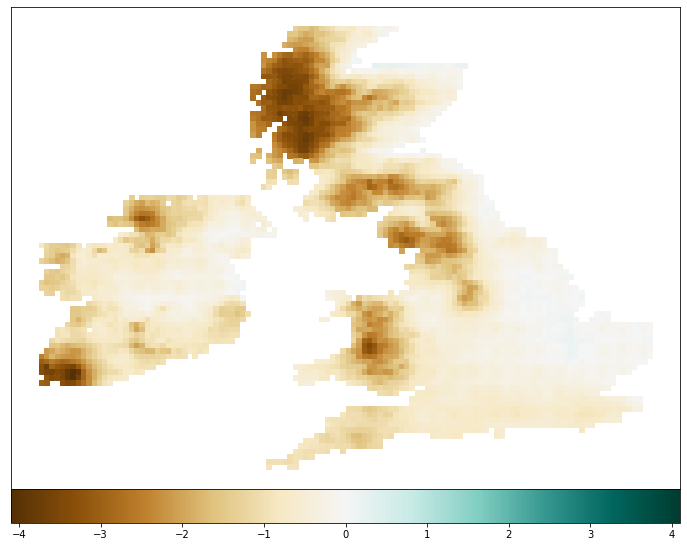

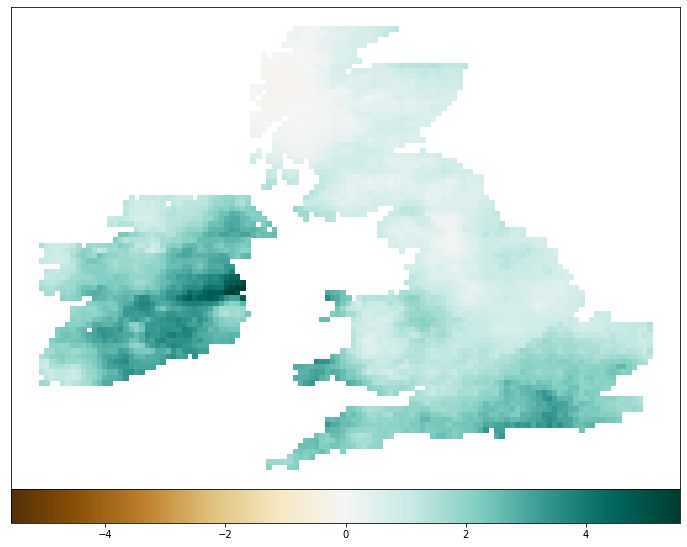

In [257]:

for map_id,map in enumerate([MAB_map,RMSB_map,Bias_map,Sampled_bias]):
    fig = plt.gcf()
    fig.set_size_inches(12,9.5)
    if map_id in [2,3]:
        plt.scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=map,cmap='BrBG',s=24,marker='s',vmin=-np.max(np.abs(map)),vmax=np.max(np.abs(map)))
        plt.colorbar(location='bottom',fraction=0.0652,pad=0.001)
        plt.yticks([])
        plt.xticks([])
        plt.show()
        continue
    plt.scatter([GNM_landonly[loc][5][1] for loc in range(4086)],[-GNM_landonly[loc][5][0] for loc in range(4086)],c=map,s=24,marker='s',vmin=0)
    plt.colorbar(location='bottom',fraction=0.0652,pad=0.001)
    plt.yticks([])
    plt.xticks([])
    plt.show()

### Median VS Observed

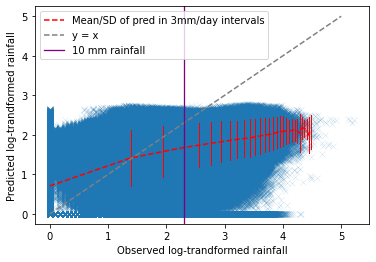

In [363]:
# median vs observed
binned_median_means = [np.log(np.mean(g_median_all[np.logical_and(all_target_rain.flatten()>-0.01+k*3, all_target_rain.flatten()<3+k*3     )])+1) for k in range(30)]
binned_median_std = [np.std(np.log(1+g_median_all[np.logical_and(all_target_rain.flatten()>-0.01+k*3, all_target_rain.flatten()<3+k*3     )])) for k in range(30)]

plt.plot(np.log([i for i in range(1,30*3,3)]),binned_median_means, color='red',linestyle='dashed',label='Mean/SD of pred in 3mm/day intervals')

for i,v in enumerate(range(1,30*3,3)):
    if i==0:
        continue
    plt.plot(np.log([v,v]),[binned_median_means[i]+binned_median_std[i] ,binned_median_means[i]-binned_median_std[i] ],'r',linewidth=1)

plt.plot([0,5],[0,5],linestyle='dashed',color='grey',label='y = x')
plt.scatter(np.log(all_target_rain.flatten()+1),np.log(g_median_all+1),marker='x',linewidths=0.3,alpha=0.3)

plt.axvline(x = np.log(10), color = 'purple', label = '10 mm rainfall',linewidth=1.3)

plt.legend(loc='upper left')

plt.xlabel('Observed log-trandformed rainfall')
plt.ylabel('Predicted log-trandformed rainfall')
plt.show()

### CRPS

### Rank histogram

In [ ]:
#GNM_landonly[location][param][day]
# 0'pred_mu', 1'pred_disp', 2'target_did_rain', 3'target_rain_value', 4'pred_p', 5'location'
def get_cdf_gnm(places):
    out=[]
    for idx,place in tqdm(enumerate(places)):
        out.append([])    
        for day in range(len(place[3])):
            obs = place[3][day]
            p = place[4][day]
            mu,disp = place[0][day],place[1][day]
            out[idx].append( tweedie.tweedie(mu=mu,phi=disp,p=p).cdf(obs)) 
    return out

In [ ]:
obs_u_all_ = []
for locs in tqdm(np.array_split(np.array(range(len(GNM_landonly))),67)):
    
    size = math.ceil(len(locs)/psutil.cpu_count())
    locs_chuncks = [[GNM_landonly[i] for i in locs][x:x+size] for x in range(0,len(locs), size)]
    
    obs_u_all_.append( Parallel(n_jobs=psutil.cpu_count())(delayed(get_cdf_gnm)(chunck) for chunck in locs_chuncks) )


 12%|█▎        | 1/8 [00:35<04:11, 35.91s/it]


KeyboardInterrupt: 

In [ ]:
# Save
with open('obs_u_all_.txt','wb') as f:
    pickle.dump(obs_u_all_,f)
'''
#Load 
with open('obs_u_all_.txt','rb') as f:
    test = pickle.load(f)'''

In [ ]:
plt.figure(figsize=(20,5))
obs_u_all = np.concatenate(np.array(obs_u_all_).flatten()).flatten()
plt.scatter( range(len(obs_u_all)),obs_u_all,s=0.000005)
plt.show()

ValueError: zero-dimensional arrays cannot be concatenated

<Figure size 1440x360 with 0 Axes>

In [ ]:
plt.figure(figsize=(5,6.5))
plt.hist(obs_u_all,bins=30,density=True,alpha=0.7)
plt.plot([0,1],[1,1])
plt.ylim(0,3)
plt.show()
plt.figure(figsize=(20,5))
plt.hist(obs_u_all,bins=100,density=True,alpha=0.7)
plt.plot([0,1],[1,1])   
plt.ylim(0,5)
plt.show()

In [ ]:
plt.hist(obs_u_all,bins=100,cumulative=True,alpha=0.7,align='mid')
plt.plot([0,1],[0,len(obs_u_all)],linestyle='dashed')
plt.show()
plt.figure(figsize=(20,5))
plt.hist(obs_u_all,bins=500,cumulative=True,alpha=0.7,align='mid',histtype='step',linewidth=2)
plt.plot([0,1],[0,len(obs_u_all)],linestyle='dashed')
plt.show()

In [90]:
sims_all_copula.shape

AttributeError: 'list' object has no attribute 'shape'

In [91]:
# Comparing samples against observed to get ranks
sims_all_copula = np.array(sims_all_copula)
ranks = []
for d,day in tqdm(enumerate(day_subset)):
    ranks.append(np.mean((sims_all_copula[d,:,:]+np.random.uniform(low=-0.0001,high=0.0001,size=(100,4087)))<(np.array([GNM_landonly[l][3][day] for l in range(len(GNM_landonly))])+np.random.uniform(low=-0.0001,high=0.0001,size=4087)),axis=0))

ranks = np.array(ranks)

500it [00:09, 51.30it/s] 


In [88]:
# Comparing samples against observed to get ranks
ranks = []
for d,day in tqdm(enumerate(day_subset)):
    ranks.append(np.mean(sims_all_copula[d,:,:]+np.random.uniform(low=-0.0001,high=0.0001,size=(100,4087))<np.array([GNM_landonly[l][3][day] for l in range(len(GNM_landonly))])+np.random.uniform(low=-0.0001,high=0.0001,size=4087),axis=0))

ranks = np.array(ranks)

0it [00:00, ?it/s]


TypeError: list indices must be integers or slices, not tuple

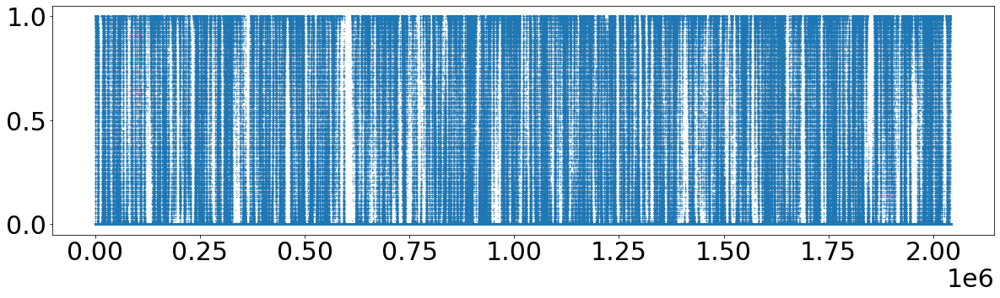

In [79]:
u_ranks = ranks.flatten()
plt.figure(figsize=(20,5))
plt.scatter(range(len(u_ranks)),u_ranks,s=0.5,alpha=0.5)
plt.show()


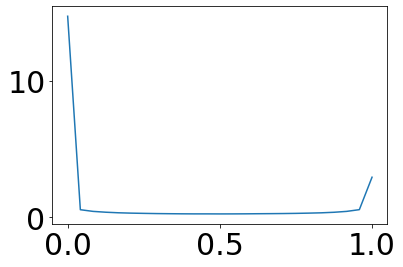

In [92]:
u_hist = np.histogram(u_ranks,bins=25,density=True)
plt.plot(np.linspace(0,1,len(u_hist[0])),u_hist[0])

In [ ]:
with open('CP_rankhist_500_subdays_samples_v3.txt','wb') as f:
    pickle.dump(u_hist[0],f)